In [32]:
from datetime import datetime, timedelta
import geopandas as gpd
import json
import pandas as pd
import mapclassify
import matplotlib.pyplot as plt
import numpy as np
import os
import requests
from shapely.geometry import Point
from io import StringIO
import warnings

warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
pd.set_option("display.max_rows", None)
np.set_printoptions(threshold=np.inf)

In [2]:
# DOH Restaurant Inspections
params_restaurants = {
    '$where': "inspection_date between '2018-01-01T00:00:00' and '2023-12-31T23:59:59' AND latitude > 0.1",
    '$limit': 500000  # Limit the number of records, adjust as needed
}
restaurants_url = 'https://data.cityofnewyork.us/resource/43nn-pn8j.geojson'
# https://data.cityofnewyork.us/Health/DOHMH-New-York-City-Restaurant-Inspection-Results/43nn-pn8j


In [3]:
# Load restaurant inspections

restuarant_response = requests.get(restaurants_url, params=params_restaurants)
restuarant_json = restuarant_response.json()
restuarant_gdf = gpd.GeoDataFrame.from_features(restuarant_json['features'])
print(len(restuarant_gdf))
restuarant_gdf.head()

193294


,geometry,nta,zipcode,latitude,dba,violation_code,score,cuisine_description,bbl,building,longitude,inspection_date,grade_date,grade,violation_description,inspection_type,census_tract,boro,bin,street,community_board,record_date,critical_flag,action,phone,council_district,camis
0,None,QN51,11354,40.767270137751,HANEUL BABSANG,09B,28,Korean,4052360127,15129,-73.812772032045,2022-12-27T00:00:00.000,None,None,Thawing procedure improper.,Cycle Inspection / Initial Inspection,115500,Queens,4118306,34TH AVE,407,2023-04-21T06:00:09.000,Not Critical,Violations were cited in the following area(s).,7184450243,20,50033695
1,None,MN40,10028,40.775412817718,MAMAN,None,0,Coffee/Tea,1015090039,1424,-73.956478321047,2022-08-23T00:00:00.000,2022-08-23T00:00:00.000,A,None,Cycle Inspection / Re-inspection,014000,Manhattan,1047526,3 AVENUE,108,2023-04-21T06:00:09.000,Not Applicable,No violations were recorded at the time of thi...,6464767660,05,50110709
2,None,BK90,11206,40.705232327599,19 CAFE,None,None,Coffee/Tea,3030790001,84,-73.944593208116,2023-01-05T00:00:00.000,None,None,None,Trans Fat / Initial Inspection,050500,Brooklyn,3071330,MANHATTAN AVENUE,301,2023-04-21T06:00:10.000,Not Applicable,No violations were recorded at the time of thi...,7183878777,34,50015841
3,None,QN70,11106,40.762659334839,TAMASHII RAMEN,09B,25,Japanese,4005880007,2905,-73.926838859608,2022-04-07T00:00:00.000,None,None,Thawing procedures improper.,Cycle Inspection / Initial Inspection,007500,Queens,4007472,BROADWAY,401,2023-04-21T06:00:09.000,Not Critical,Violations were cited in the following area(s).,7182785888,22,50000249
4,None,BX08,10472,40.831329469463,FU XING,None,0,Chinese,2037780028,1270,-73.875030657296,2022-05-17T00:00:00.000,2022-05-17T00:00:00.000,Z,None,Cycle Inspection / Reopening Inspection,006200,Bronx,2025386,MORRISON AVENUE,209,2023-04-21T06:00:09.000,Not Applicable,Establishment re-opened by DOHMH.,9298556668,18,50084872


In [4]:
restuarant_gdf.critical_flag.value_counts()

Critical          107120
Not Critical       83955
Not Applicable      2219
Name: critical_flag, dtype: int64

In [8]:
restuarant_gdf.action.value_counts()

Violations were cited in the following area(s).                                                                                       183097
Establishment Closed by DOHMH. Violations were cited in the following area(s) and those requiring immediate action were addressed.      7373
Establishment re-opened by DOHMH.                                                                                                       1812
No violations were recorded at the time of this inspection.                                                                             1008
Establishment re-closed by DOHMH.                                                                                                          4
Name: action, dtype: int64

In [35]:
# Filters

# Only include the critical 
pest_control_df = restuarant_gdf[restuarant_gdf['critical_flag'] == 'Critical']
print(len(pest_control_df))

# Only keep violations related to mice/rats, flies, roaches 
pest_control_codes = ['04K', '04L', '04M', '04N']
pest_control_df = pest_control_df[pest_control_df['violation_code'].isin(pest_control_codes)]
print(len(pest_control_df))

# Remove the re-opened and no violations 
remove_actions = ['Establishment re-opened by DOHMH.',
                  'No violations were recorded at the time of this inspection.']
pest_control_df = pest_control_df[~(pest_control_df['action'].isin(remove_actions))]

pest_control_df.head(2)

107120
29287


,geometry,nta,zipcode,latitude,dba,violation_code,score,cuisine_description,bbl,building,longitude,inspection_date,grade_date,grade,violation_description,inspection_type,census_tract,boro,bin,street,community_board,record_date,critical_flag,action,phone,council_district,camis
36,None,QN52,11355,40.750578335059,SATAY HOUSE,04M,23,Asian/Asian Fusion,4052080001,4601,-73.819063069054,2022-07-26T00:00:00.000,None,None,Live roaches in facility's food or non-food area.,Cycle Inspection / Initial Inspection,120500,Queens,4117599,KISSENA BLVD,407,2023-04-21T06:00:09.000,Critical,Violations were cited in the following area(s).,7188881868,20,50093495
46,None,QN22,11354,40.760330552591,ALOHA SUSHI,04M,0,Japanese,4049787501,13617,-73.82987293105,2022-09-12T00:00:00.000,2022-09-12T00:00:00.000,A,Live roaches in facility's food or non-food area.,Pre-permit (Operational) / Re-inspection,087100,Queens,4534816,39TH AVE,407,2023-04-21T06:00:09.000,Critical,Violations were cited in the following area(s).,9292943581,20,50106059


In [36]:
pest_control_df.action.value_counts()

Violations were cited in the following area(s).                                                                                       27204
Establishment Closed by DOHMH. Violations were cited in the following area(s) and those requiring immediate action were addressed.     1683
Name: action, dtype: int64

In [37]:
pest_control_df.violation_description.value_counts()

Evidence of mice or live mice present in facility's food and/or non-food areas.                                                                                                                                                                                                                        8116
Evidence of mice or live mice in establishment's food or non-food areas.                                                                                                                                                                                                                               5406
Filth flies or food/refuse/sewage-associated (FRSA) flies present in facility’s food and/or non-food areas.  Filth flies include house flies, little house flies, blow flies, bottle flies and flesh flies.  Food/refuse/sewage-associated flies include fruit flies, drain flies and Phorid flies.    5260
Filth flies or food/refuse/sewage associated with (FRSA) flies or other nuisance pests  in  establis

In [38]:
top_cuisines = pest_control_df.cuisine_description.value_counts().nlargest(10).index.to_list()
pest_control_df['cuisine_group'] = np.where(pest_control_df.cuisine_description.isin(top_cuisines), pest_control_df.cuisine_description, 'other')
pest_control_df.cuisine_group.value_counts()

other                       10817
American                     4574
Chinese                      3095
Pizza                        1916
Coffee/Tea                   1419
Caribbean                    1346
Latin American               1219
Mexican                      1199
Bakery Products/Desserts     1195
Italian                      1135
Japanese                      972
Name: cuisine_group, dtype: int64

In [39]:
# Create a function to simplify location type

def simplify_violation(cuisine_group, violation_description):
    
    if 'rats' in violation_description or 'mice' in violation_description:
        return "{}_{}".format(cuisine_group, "rats/mice")

    if 'roaches' in violation_description:
        return "{}_{}".format(cuisine_group, "roaches")

    if 'flies' in violation_description:
        return "{}_{}".format(cuisine_group, "flies") 
    
    print(violation_description) # Unhandled groups
       
pest_control_df['violation_group'] = pest_control_df.apply(lambda row: simplify_violation(row['cuisine_group'], row['violation_description']), axis=1)
                      
pest_control_df.violation_group.value_counts()


other_rats/mice                       5654
other_flies                           3619
American_rats/mice                    2358
Chinese_rats/mice                     1887
American_flies                        1756
other_roaches                         1544
Pizza_rats/mice                       1169
Coffee/Tea_rats/mice                   759
Caribbean_rats/mice                    720
Bakery Products/Desserts_rats/mice     655
Italian_rats/mice                      624
Chinese_flies                          623
Japanese_rats/mice                     614
Mexican_rats/mice                      585
Chinese_roaches                        585
Latin American_rats/mice               570
Coffee/Tea_flies                       557
Pizza_flies                            474
American_roaches                       460
Caribbean_flies                        433
Latin American_flies                   395
Mexican_flies                          385
Italian_flies                          359
Bakery Prod

In [40]:
# Add year to the violation 

def create_date_cols(df):
    df['inspection_date'] = pd.to_datetime(df['inspection_date'])

    # Create new columns for month, day of the week, and hour of the day
    df['year'] = df['inspection_date'].dt.strftime('%Y')  # Year as a string
    return df

pest_control_df = create_date_cols(pest_control_df)
pest_control_df.year.value_counts()

2022    13718
2023     4467
2019     4316
2021     3813
2020     2061
2018      512
Name: year, dtype: int64

In [42]:
# Convert the data to a geodataframe
relevant_inspection_fields = ['latitude','longitude', 'year', 'violation_group']

# Convert latitude and longitude to numeric types
pest_control_df['latitude'] = pd.to_numeric(pest_control_df['latitude'], errors='coerce')
pest_control_df['longitude'] = pd.to_numeric(pest_control_df['longitude'], errors='coerce')

# Create the geometry column
geometry = [Point(xy) for xy in zip(pest_control_df.longitude, pest_control_df.latitude)]

# Create the geodataframe
pest_control_gdf = gpd.GeoDataFrame(pest_control_df[relevant_inspection_fields], geometry=geometry)

# Drop the latitude and longitude columns
pest_control_gdf = pest_control_gdf.drop(['latitude', 'longitude'], axis=1)

pest_control_gdf.head()

,year,violation_group,geometry
36,2022,other_roaches,POINT (-73.81906 40.75058)
46,2022,Japanese_roaches,POINT (-73.82987 40.76033)
57,2023,Coffee/Tea_roaches,POINT (-73.92950 40.69373)
65,2022,Italian_roaches,POINT (-73.95052 40.65961)
87,2023,Chinese_rats/mice,POINT (-73.99717 40.71515)


<AxesSubplot:>

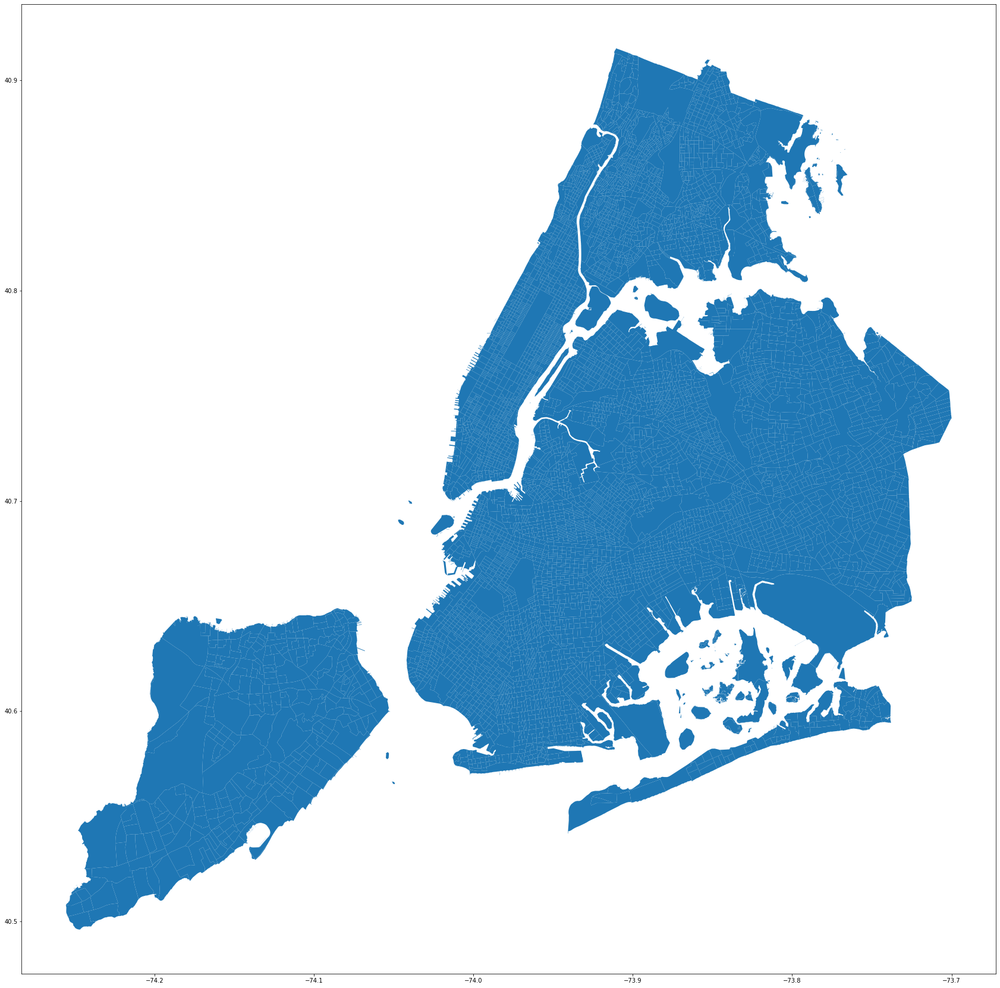

In [43]:
parent_dir = os.path.abspath('..')  # get the absolute path of the parent directory
file_path = os.path.join(parent_dir, 'Data', 'nyc_bgrp.geojson')  # construct the file path
cb_gdf = gpd.read_file(file_path)  # load the GeoJSON file into a GeoDataFrame
cb_gdf.plot(figsize=(30,30))

In [45]:
# One hot encode the variables to columns

violations_encoded = pd.get_dummies(pest_control_gdf['violation_group'], prefix='i')
    
# Merge new variables
violations_merge = pd.merge(pest_control_gdf, violations_encoded, left_index=True, right_index=True)
pest_control_encoded_gdf = gpd.GeoDataFrame(violations_merge, geometry='geometry')

pest_control_encoded_gdf.head(5)

,year,violation_group,geometry,i_American_flies,i_American_rats/mice,i_American_roaches,i_Bakery Products/Desserts_flies,i_Bakery Products/Desserts_rats/mice,i_Bakery Products/Desserts_roaches,i_Caribbean_flies,i_Caribbean_rats/mice,i_Caribbean_roaches,i_Chinese_flies,i_Chinese_rats/mice,i_Chinese_roaches,i_Coffee/Tea_flies,i_Coffee/Tea_rats/mice,i_Coffee/Tea_roaches,i_Italian_flies,i_Italian_rats/mice,i_Italian_roaches,i_Japanese_flies,i_Japanese_rats/mice,i_Japanese_roaches,i_Latin American_flies,i_Latin American_rats/mice,i_Latin American_roaches,i_Mexican_flies,i_Mexican_rats/mice,i_Mexican_roaches,i_Pizza_flies,i_Pizza_rats/mice,i_Pizza_roaches,i_other_flies,i_other_rats/mice,i_other_roaches
36,2022,other_roaches,POINT (-73.81906 40.75058),0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
46,2022,Japanese_roaches,POINT (-73.82987 40.76033),0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
57,2023,Coffee/Tea_roaches,POINT (-73.92950 40.69373),0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
65,2022,Italian_roaches,POINT (-73.95052 40.65961),0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
87,2023,Chinese_rats/mice,POINT (-73.99717 40.71515),0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [46]:
# Perform spatial join
pest_control_joined_tracts_gdf = gpd.sjoin(pest_control_encoded_gdf, cb_gdf[['geometry','spatial_id']], op='within', how='left')

def aggregate_pest_control(df):
    # Aggregate the complaints
    inspection_columns = [col for col in df.columns if col.startswith('i_')]
    inspection_agg_dict = {col: ['sum'] for col in inspection_columns}
    inspection_agg_dict['year'] = 'count'
    inspection_agg_df = df.groupby(['spatial_id','year']).agg(inspection_agg_dict).reset_index()
    inspection_agg_df.columns = inspection_agg_df.columns.map('_'.join)
    inspection_agg_df = inspection_agg_df.rename(columns={'year_count': 'num_violations',
                                                        'year_':'year',
                                                        'spatial_id_':'spatial_id'})
    return inspection_agg_df
    
pest_control_agg_df = aggregate_pest_control(pest_control_joined_tracts_gdf)
pest_control_agg_df.head()

,spatial_id,year,i_American_flies_sum,i_American_rats/mice_sum,i_American_roaches_sum,i_Bakery Products/Desserts_flies_sum,i_Bakery Products/Desserts_rats/mice_sum,i_Bakery Products/Desserts_roaches_sum,i_Caribbean_flies_sum,i_Caribbean_rats/mice_sum,i_Caribbean_roaches_sum,i_Chinese_flies_sum,i_Chinese_rats/mice_sum,i_Chinese_roaches_sum,i_Coffee/Tea_flies_sum,i_Coffee/Tea_rats/mice_sum,i_Coffee/Tea_roaches_sum,i_Italian_flies_sum,i_Italian_rats/mice_sum,i_Italian_roaches_sum,i_Japanese_flies_sum,i_Japanese_rats/mice_sum,i_Japanese_roaches_sum,i_Latin American_flies_sum,i_Latin American_rats/mice_sum,i_Latin American_roaches_sum,i_Mexican_flies_sum,i_Mexican_rats/mice_sum,i_Mexican_roaches_sum,i_Pizza_flies_sum,i_Pizza_rats/mice_sum,i_Pizza_roaches_sum,i_other_flies_sum,i_other_rats/mice_sum,i_other_roaches_sum,num_violations
0,360050004002,2019,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
1,360050004002,2020,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
2,360050004002,2022,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
3,360050004002,2023,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
4,360050019001,2019,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [47]:
# Duplicate the census blocks per years in dataset 
years = pest_control_agg_df.year.unique()

years_cb_gdf = pd.DataFrame() # empty dataframe

for year in years:
    year_cb_gdf = cb_gdf.copy()
    year_cb_gdf['year'] = year
    years_cb_gdf = pd.concat([years_cb_gdf, year_cb_gdf])

print(len(years_cb_gdf))

years_cb_gdf.head(5)


38958


,spatial_id,name,%OfOwnerOccupiedHousing,%OfRenterOccupiedHousing,MedianHouseholdIncome,TotalPopulation,geometry,year
0,360050001000,"BG0001000, Bronx County, NY",0.0000,0.0000,NaN,0.0,"MULTIPOLYGON (((-73.89679 40.79616, -73.89681 ...",2019
1,360050001001,"BG0001001, Bronx County, NY",0.0000,0.0000,NaN,6472.0,"POLYGON ((-73.89076 40.79782, -73.89076 40.797...",2019
2,360050002000,"BG0002000, Bronx County, NY",0.0000,0.0000,NaN,0.0,"MULTIPOLYGON (((-73.86163 40.80990, -73.86111 ...",2019
3,360050002001,"BG0002001, Bronx County, NY",48.0435,51.7391,40196.019522,1816.0,"POLYGON ((-73.86240 40.81491, -73.86148 40.815...",2019
4,360050002002,"BG0002002, Bronx County, NY",30.8962,68.8679,47662.679687,1124.0,"MULTIPOLYGON (((-73.86425 40.81466, -73.86333 ...",2019


In [48]:
# Merge back to the census tracts 
pest_control_gdf = pd.merge(years_cb_gdf, pest_control_agg_df, on=['spatial_id','year'], how='left')

column_list = pest_control_gdf.columns[8:]
pest_control_gdf[column_list] = pest_control_gdf[column_list].fillna(0)
pest_control_gdf.head()

,spatial_id,name,%OfOwnerOccupiedHousing,%OfRenterOccupiedHousing,MedianHouseholdIncome,TotalPopulation,geometry,year,i_American_flies_sum,i_American_rats/mice_sum,i_American_roaches_sum,i_Bakery Products/Desserts_flies_sum,i_Bakery Products/Desserts_rats/mice_sum,i_Bakery Products/Desserts_roaches_sum,i_Caribbean_flies_sum,i_Caribbean_rats/mice_sum,i_Caribbean_roaches_sum,i_Chinese_flies_sum,i_Chinese_rats/mice_sum,i_Chinese_roaches_sum,i_Coffee/Tea_flies_sum,i_Coffee/Tea_rats/mice_sum,i_Coffee/Tea_roaches_sum,i_Italian_flies_sum,i_Italian_rats/mice_sum,i_Italian_roaches_sum,i_Japanese_flies_sum,i_Japanese_rats/mice_sum,i_Japanese_roaches_sum,i_Latin American_flies_sum,i_Latin American_rats/mice_sum,i_Latin American_roaches_sum,i_Mexican_flies_sum,i_Mexican_rats/mice_sum,i_Mexican_roaches_sum,i_Pizza_flies_sum,i_Pizza_rats/mice_sum,i_Pizza_roaches_sum,i_other_flies_sum,i_other_rats/mice_sum,i_other_roaches_sum,num_violations
0,360050001000,"BG0001000, Bronx County, NY",0.0000,0.0000,NaN,0.0,"MULTIPOLYGON (((-73.89679 40.79616, -73.89681 ...",2019,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,360050001001,"BG0001001, Bronx County, NY",0.0000,0.0000,NaN,6472.0,"POLYGON ((-73.89076 40.79782, -73.89076 40.797...",2019,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,360050002000,"BG0002000, Bronx County, NY",0.0000,0.0000,NaN,0.0,"MULTIPOLYGON (((-73.86163 40.80990, -73.86111 ...",2019,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,360050002001,"BG0002001, Bronx County, NY",48.0435,51.7391,40196.019522,1816.0,"POLYGON ((-73.86240 40.81491, -73.86148 40.815...",2019,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,360050002002,"BG0002002, Bronx County, NY",30.8962,68.8679,47662.679687,1124.0,"MULTIPOLYGON (((-73.86425 40.81466, -73.86333 ...",2019,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


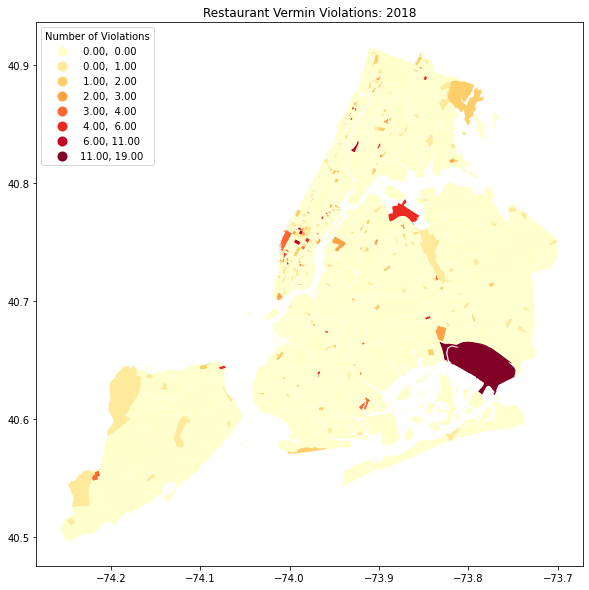

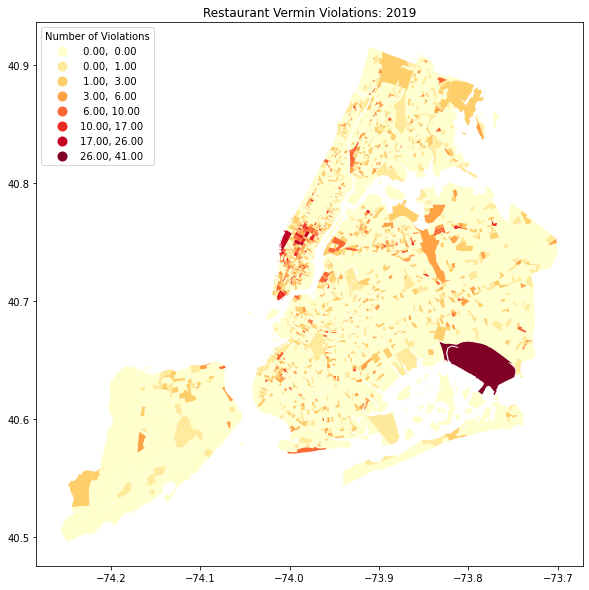

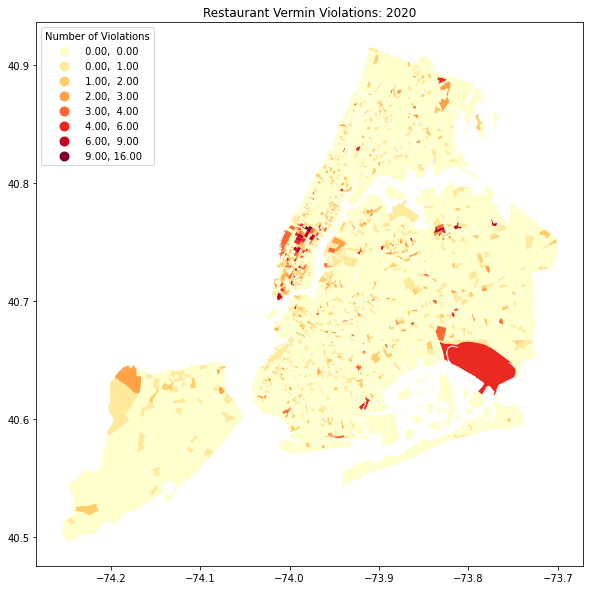

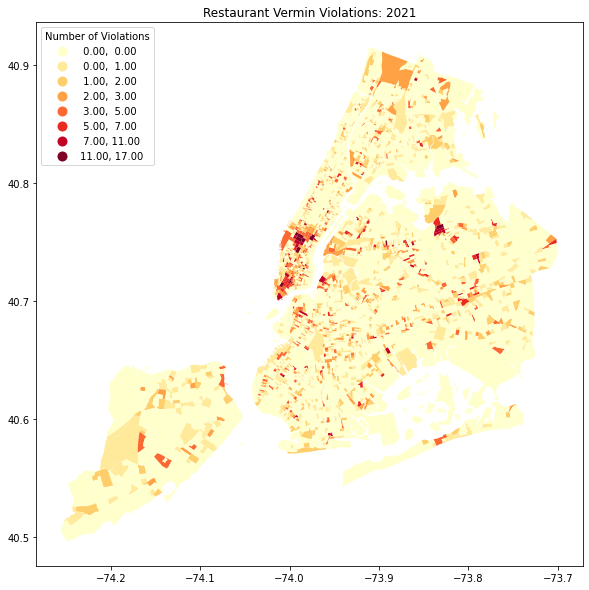

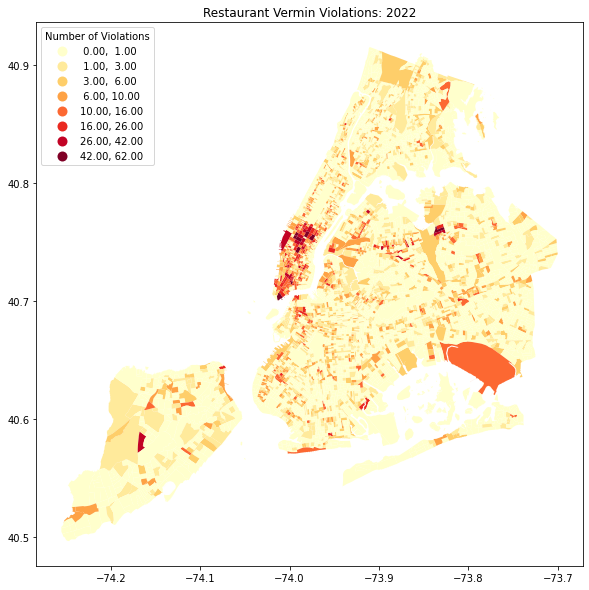

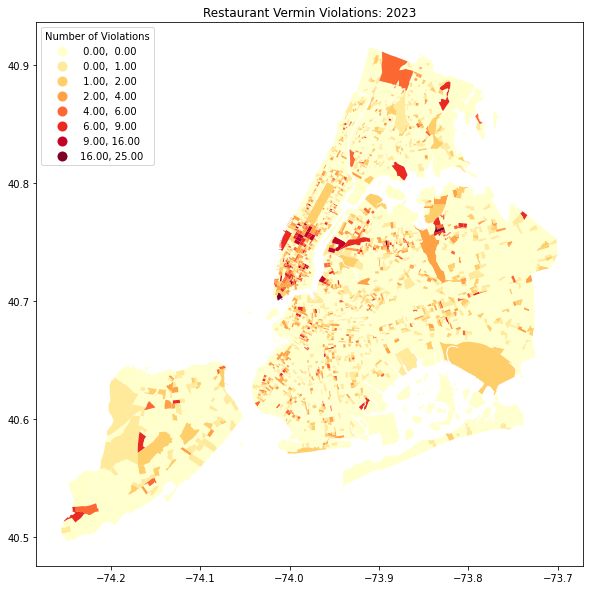

In [49]:
years = sorted(years)
for year in years:
    pest_control_annual_gdf = pest_control_gdf[(pest_control_gdf['year']==year)]
    # Natural Breaks (Jenks)
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    pest_control_annual_gdf.plot(column='num_violations',
                        ax=ax,
                        cmap='YlOrRd',
                        scheme='natural_breaks',
                        k=8,
                        legend=True,
                        missing_kwds={'color': 'lightgray'},
                        legend_kwds={'loc': 'upper left', 'title': 'Number of Violations'})
    plt.title('Restaurant Vermin Violations: {0}'.format(year))
    plt.show()

In [50]:
pest_control_slim_gdf = pest_control_gdf[(pest_control_gdf['year']=='2021')]
pest_control_slim_gdf.sort_values(by='num_violations', ascending=False).head(5)

,spatial_id,name,%OfOwnerOccupiedHousing,%OfRenterOccupiedHousing,MedianHouseholdIncome,TotalPopulation,geometry,year,i_American_flies_sum,i_American_rats/mice_sum,i_American_roaches_sum,i_Bakery Products/Desserts_flies_sum,i_Bakery Products/Desserts_rats/mice_sum,i_Bakery Products/Desserts_roaches_sum,i_Caribbean_flies_sum,i_Caribbean_rats/mice_sum,i_Caribbean_roaches_sum,i_Chinese_flies_sum,i_Chinese_rats/mice_sum,i_Chinese_roaches_sum,i_Coffee/Tea_flies_sum,i_Coffee/Tea_rats/mice_sum,i_Coffee/Tea_roaches_sum,i_Italian_flies_sum,i_Italian_rats/mice_sum,i_Italian_roaches_sum,i_Japanese_flies_sum,i_Japanese_rats/mice_sum,i_Japanese_roaches_sum,i_Latin American_flies_sum,i_Latin American_rats/mice_sum,i_Latin American_roaches_sum,i_Mexican_flies_sum,i_Mexican_rats/mice_sum,i_Mexican_roaches_sum,i_Pizza_flies_sum,i_Pizza_rats/mice_sum,i_Pizza_roaches_sum,i_other_flies_sum,i_other_rats/mice_sum,i_other_roaches_sum,num_violations
29570,360610092001,"BG0092001, New York County, NY",18.7371,81.1594,135872.411861,1403.0,"POLYGON ((-73.97743 40.75372, -73.97697 40.754...",2021,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,5.0,2.0,0.0,17.0
29633,360610113001,"BG0113001, New York County, NY",54.3478,43.4783,99958.800000,87.0,"POLYGON ((-73.99073 40.75595, -73.99028 40.756...",2021,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,1.0,0.0,1.0,3.0,1.0,0.0,15.0
29317,360610032001,"BG0032001, New York County, NY",0.7407,99.1770,116934.593413,1895.0,"POLYGON ((-73.98488 40.72819, -73.98266 40.727...",2021,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,6.0,0.0,15.0
30897,360810289003,"BG0289003, Queens County, NY",42.8191,57.0922,71200.184827,2969.0,"POLYGON ((-73.89212 40.75100, -73.89119 40.751...",2021,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,4.0,3.0,14.0
26004,360050025001,"BG0025001, Bronx County, NY",4.6729,95.0156,33432.285714,857.0,"POLYGON ((-73.91922 40.80756, -73.91748 40.806...",2021,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,4.0,0.0,2.0,1.0,1.0,14.0


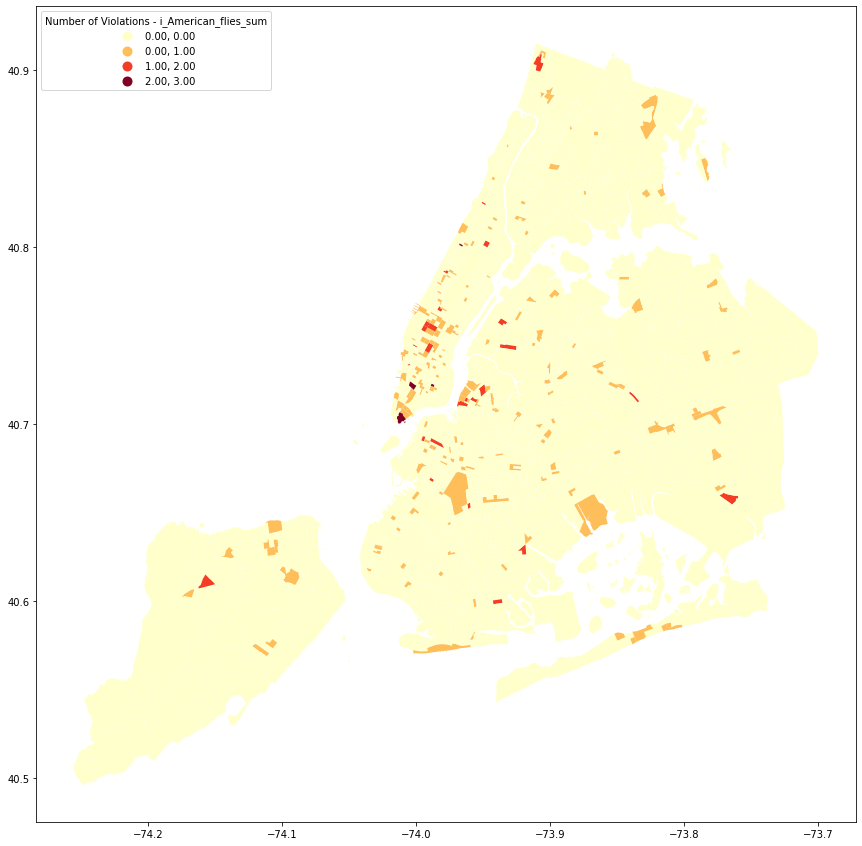

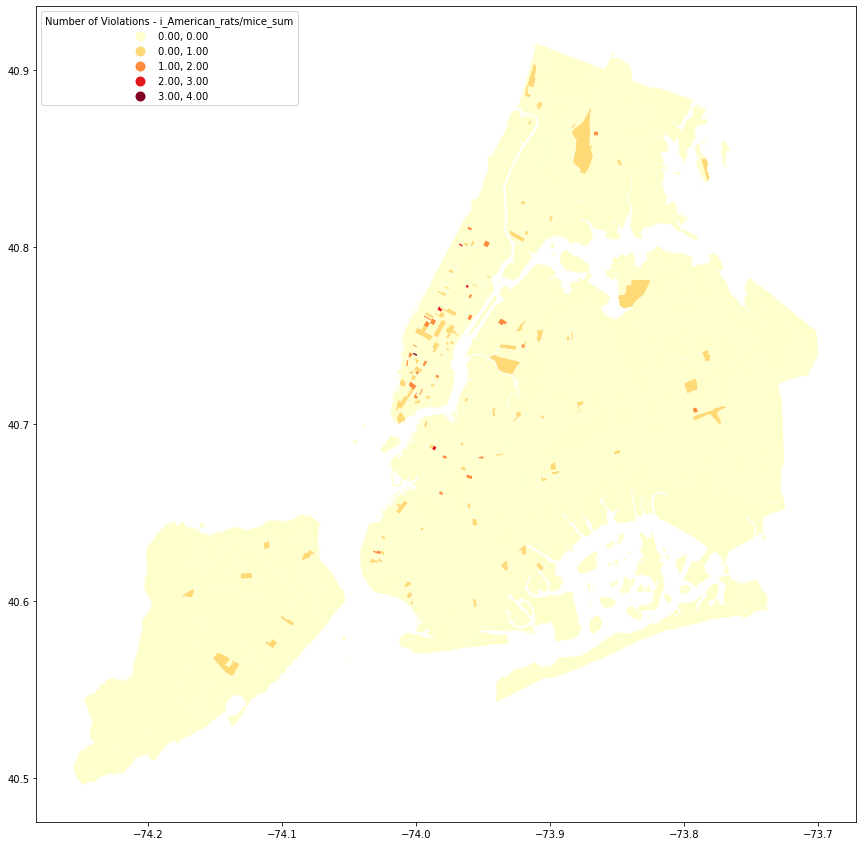

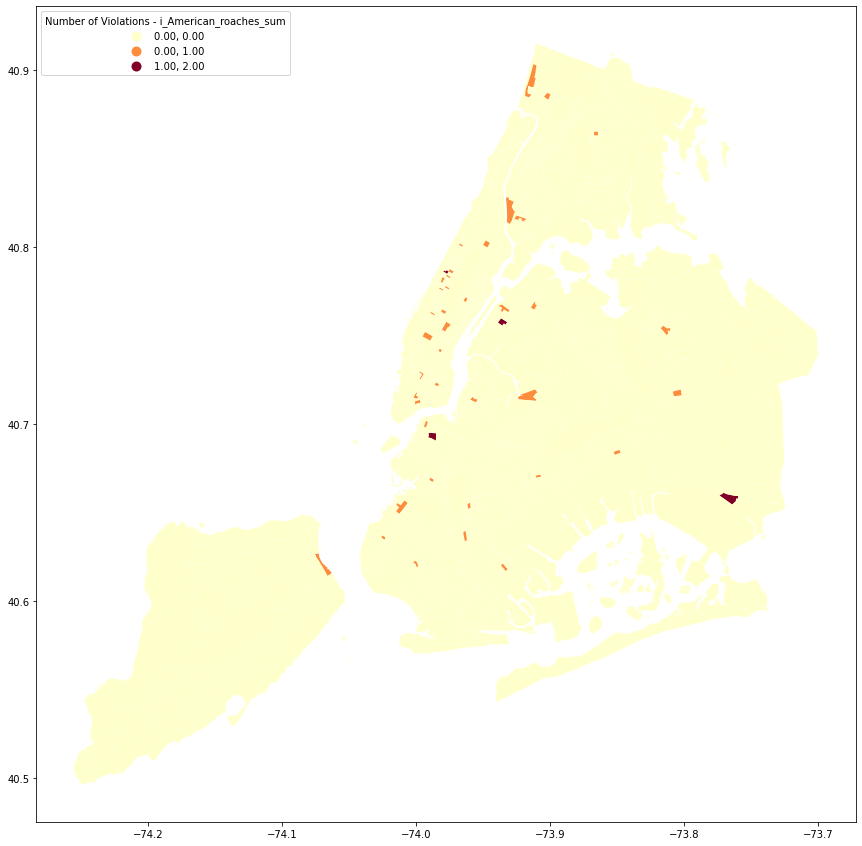

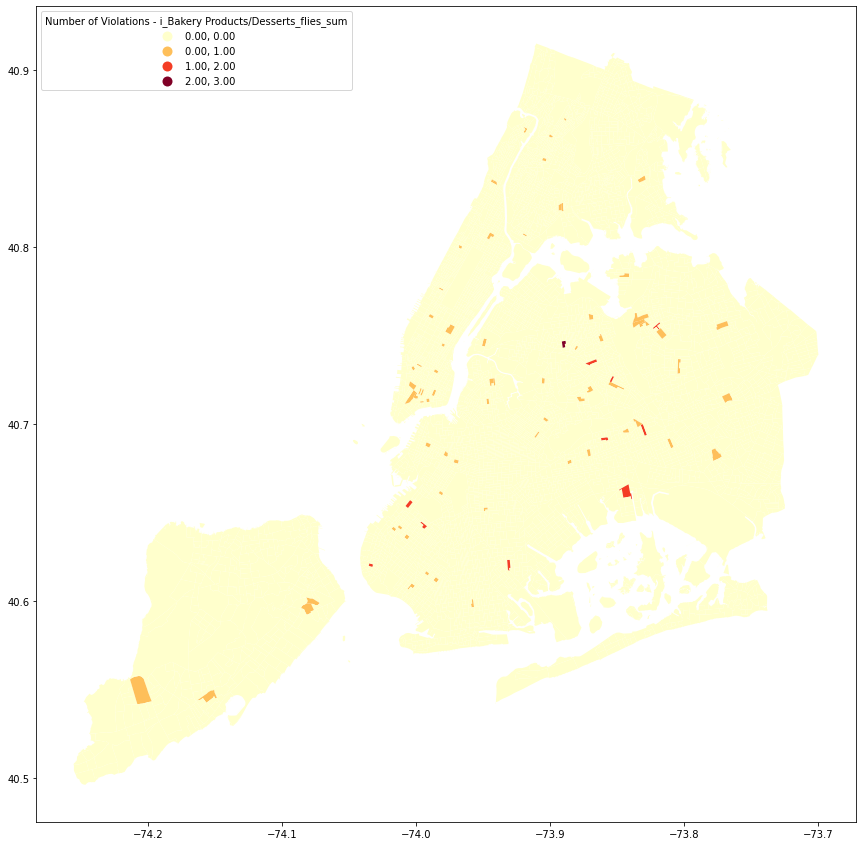

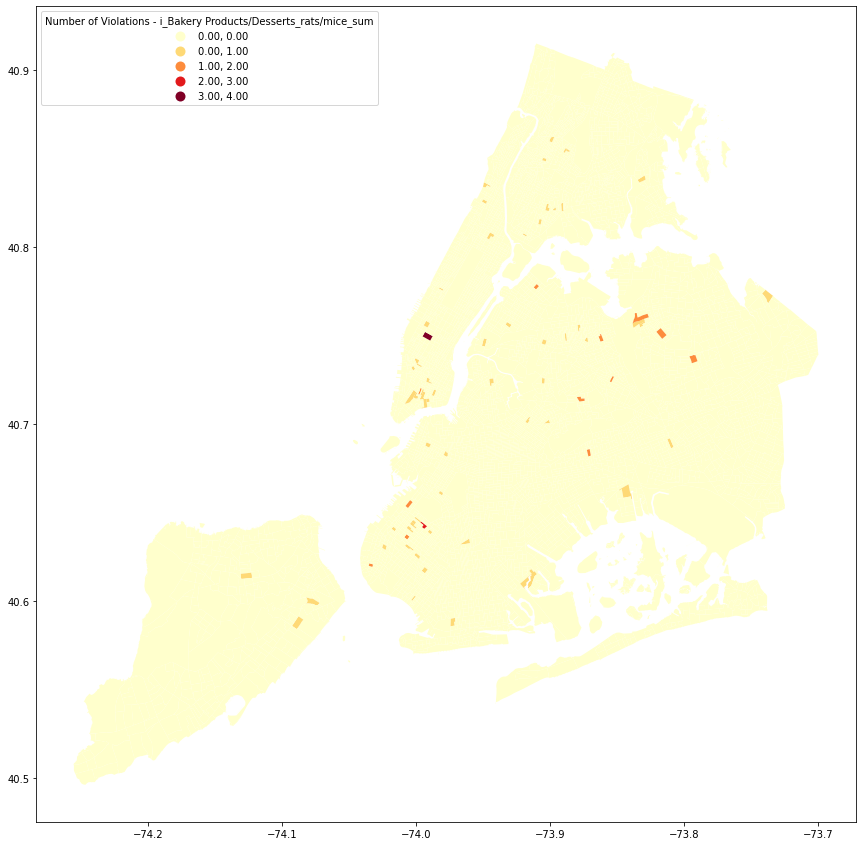

...

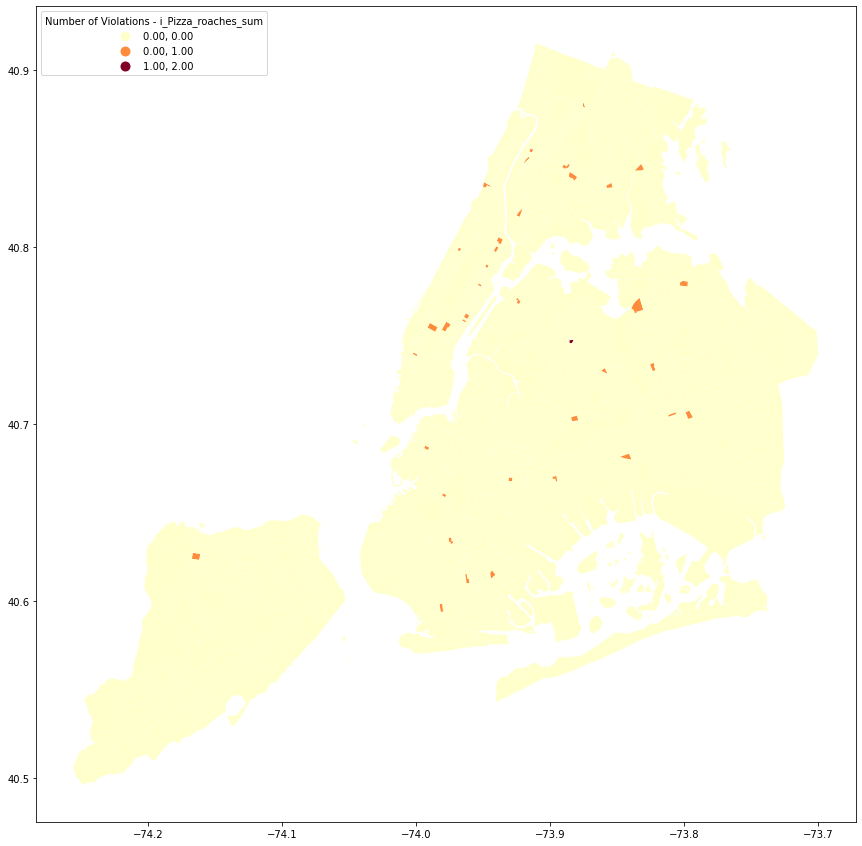

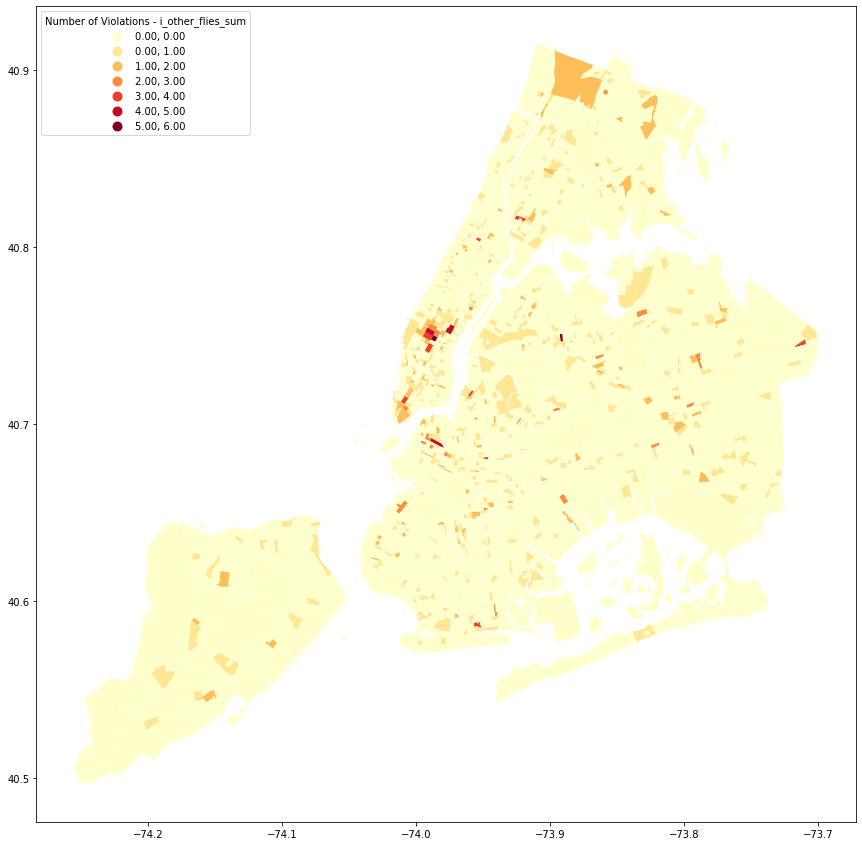

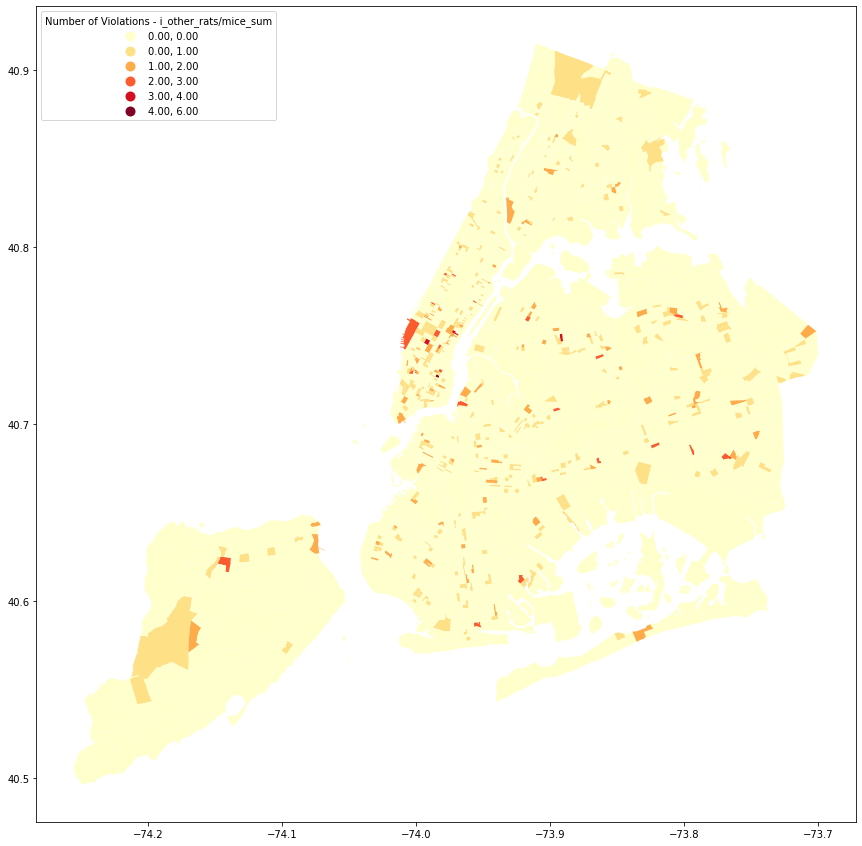

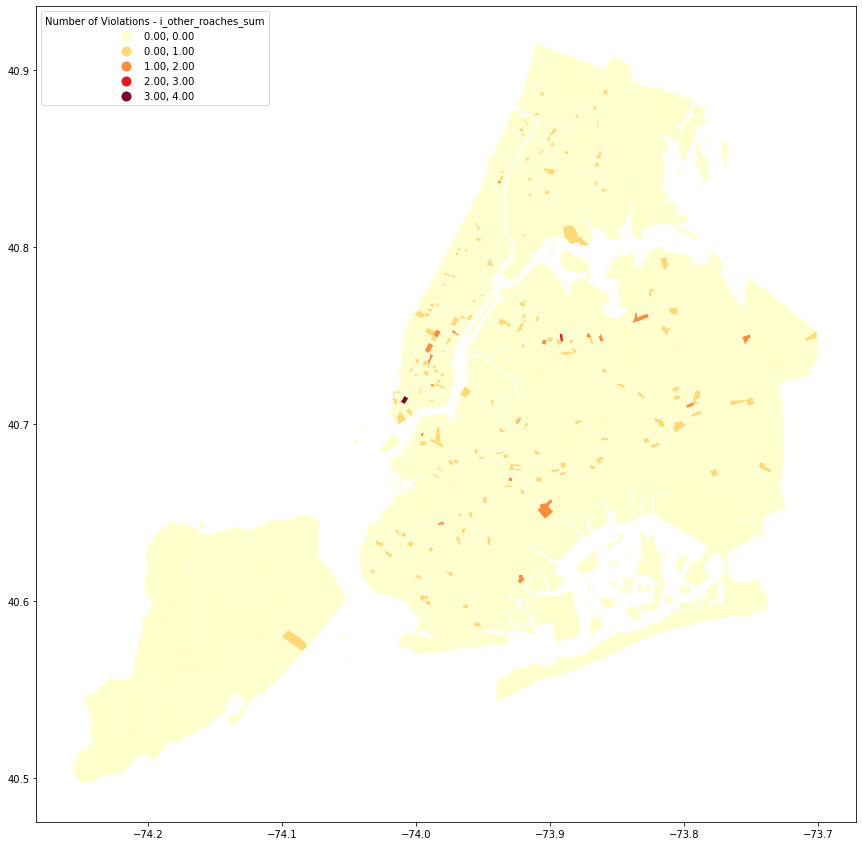

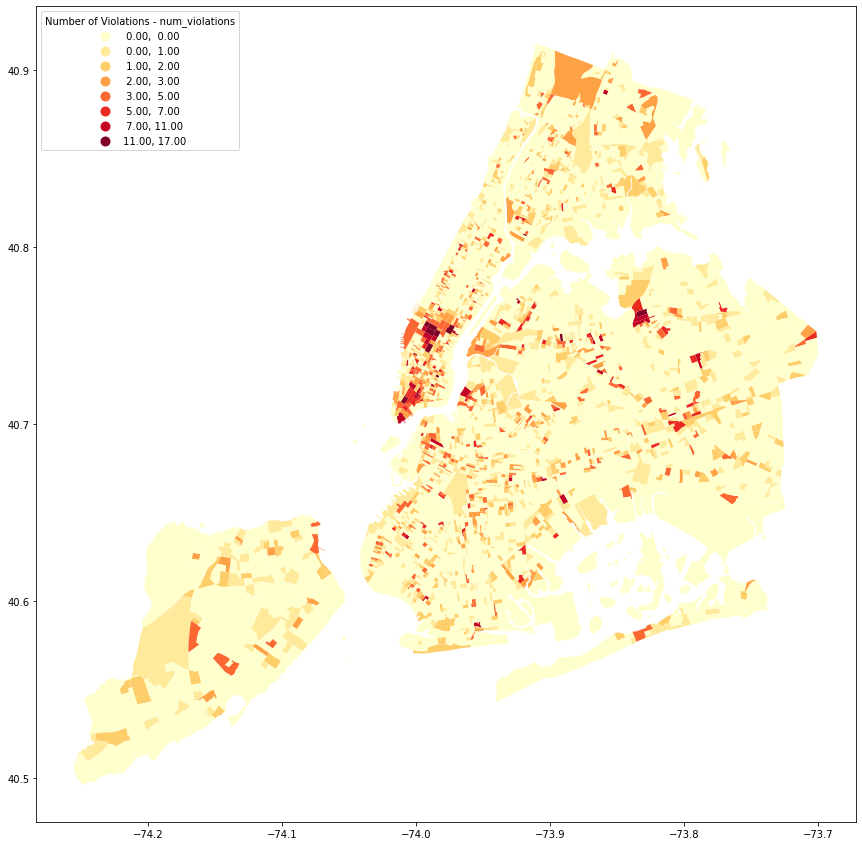

In [52]:
def plot_map(column_name, title):
    fig, ax = plt.subplots(1, 1, figsize=(15, 15))
    pest_control_slim_gdf.plot(column=column_name,
                        ax=ax,
                        cmap='YlOrRd',
                        scheme='natural_breaks',
                        k=8,
                        legend=True,
                        missing_kwds={'color': 'lightgray'},
                        legend_kwds={'loc': 'upper left', 'title': title})
    plt.show()

for column in column_list:
    plot_title = f'Number of Violations - {column}'
    plot_map(column, plot_title)

In [55]:
export_columns = ['spatial_id'] + pest_control_gdf.columns[7:].to_list()
print(export_columns)
parent_dir = os.path.abspath('..')  # get the absolute path of the parent directory
file_path = os.path.join(parent_dir, 'Data', 'violations_per_year.csv')  # construct the file path
pest_control_gdf[export_columns].to_csv(file_path, index=False)

['spatial_id', 'year', 'i_American_flies_sum', 'i_American_rats/mice_sum', 'i_American_roaches_sum', 'i_Bakery Products/Desserts_flies_sum', 'i_Bakery Products/Desserts_rats/mice_sum', 'i_Bakery Products/Desserts_roaches_sum', 'i_Caribbean_flies_sum', 'i_Caribbean_rats/mice_sum', 'i_Caribbean_roaches_sum', 'i_Chinese_flies_sum', 'i_Chinese_rats/mice_sum', 'i_Chinese_roaches_sum', 'i_Coffee/Tea_flies_sum', 'i_Coffee/Tea_rats/mice_sum', 'i_Coffee/Tea_roaches_sum', 'i_Italian_flies_sum', 'i_Italian_rats/mice_sum', 'i_Italian_roaches_sum', 'i_Japanese_flies_sum', 'i_Japanese_rats/mice_sum', 'i_Japanese_roaches_sum', 'i_Latin American_flies_sum', 'i_Latin American_rats/mice_sum', 'i_Latin American_roaches_sum', 'i_Mexican_flies_sum', 'i_Mexican_rats/mice_sum', 'i_Mexican_roaches_sum', 'i_Pizza_flies_sum', 'i_Pizza_rats/mice_sum', 'i_Pizza_roaches_sum', 'i_other_flies_sum', 'i_other_rats/mice_sum', 'i_other_roaches_sum', 'num_violations']
